# Project : Data augmentation with numpy

### Work done by Ouahbi Haj Kacem

In [1]:
import cv2 # Importing OpenCV(cv2) module#   # Used only to read the image in read function#
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import random

In [2]:
class ImageTransformations(object):
    
    def __init__(self, image):
        self.image = image
     
    def read(self, gray_scale=False):
        image_src = cv2.imread(self.image)
        image_rgb = cv2.cvtColor(image_src, cv2.COLOR_BGR2RGB)
        return image_rgb
    
    def rotate(self, angle_rotation, pivot_point, shape_img, with_plot=False, with_plot_2=False, gray_scale=False):
        image_src = self.read(gray_scale=gray_scale)
        rotate_matrice=np.transpose(np.array([[np.cos(angle_rotation), -np.sin(angle_rotation)],
                                              [np.sin(angle_rotation), np.cos(angle_rotation)]]))
        h,w=shape_img
        x_pivot=pivot_point[0]
        y_pivot=pivot_point[1] 
        image_rot=np.zeros(image_src.shape,dtype='u1')
        for height in range(h):
            for width in range(w):
                xy_matrice=np.array([[width-x_pivot],[height-y_pivot]])
                rotate_mat=np.dot(rotate_matrice, xy_matrice)
                newx=x_pivot+ int(rotate_mat[0])
                newy=y_pivot+ int(rotate_mat[1])
                
                if(0<=newx<=w-1) and (0<=newy<=h-1):
                    image_rot[newy,newx]=image_src[height,width]          
        if with_plot:
            self.plot(orig_matrix=image_src, trans_matrix=image_rot, head_text='Rotated', gray_scale=gray_scale)
            return None
        if with_plot_2:
            self.plot_2(trans_matrix=image_rot, head_text='Rotated', gray_scale=gray_scale)
            return None
        return image_rot

    def vertical_flip(self, with_plot=False, with_plot_2=False, gray_scale=False):
        image_rgb = self.read(gray_scale=gray_scale)
        image_flip = np.array(list(reversed(image_rgb)))
        if with_plot:
            self.plot(orig_matrix=image_rgb, trans_matrix=image_flip, head_text='Vertical Flipped', gray_scale=gray_scale)
            return None
        if with_plot_2:
            self.plot_2(trans_matrix=image_flip, head_text='Vertical Flipped', gray_scale=gray_scale)
            return None
        return image_flip
      
    def horizontal_flip(self, with_plot=False, with_plot_2=False, gray_scale=False):
        image_rgb = self.read(gray_scale=gray_scale)
        image_flip = np.array([list(reversed(row)) for row in image_rgb])
        if with_plot:
            self.plot(orig_matrix=image_rgb, trans_matrix=image_flip, head_text='Horizontal Flipped', gray_scale=gray_scale)
            return None
        if with_plot_2:
            self.plot_2(trans_matrix=image_flip, head_text='Horizontal Flipped', gray_scale=gray_scale)
            return None
        return image_flip
       
    def cropping(self, start_pos, length, width, with_plot=False, with_plot_2=False, gray_scale=False):
        image_src = self.read(gray_scale=gray_scale)
        image_shape = image_src.shape
        length = abs(length)
        width = abs(width)
        
        start_row = start_pos if start_pos >= 0 else 0
        start_column = start_row
        end_row = length + start_row
        end_row = end_row if end_row <= image_shape[0] else image_shape[0]
        end_column = width + start_column
        end_column = end_column if end_column <= image_shape[1] else image_shape[1]
    
        image_cropped = image_src[start_row:end_row, start_column:end_column] 
        if with_plot:
            self.plot(orig_matrix=image_src, trans_matrix=image_cropped, head_text='Cropped', gray_scale=gray_scale)
            return None
        if with_plot_2:
            self.plot_2(trans_matrix=image_cropped, head_text='Cropped', gray_scale=gray_scale)
            return None
        return image_cropped
    
    def translation_along_x(self,shift_distance,shape_of_out_img, with_plot=False, with_plot_2=False, gray_scale=False):
        image_src = self.read(gray_scale=gray_scale)
        h,w = image_src.shape[:2]
        x_distance = shift_distance[0]
        y_distance = shift_distance[1]
        ts_mat = np.array([[1,0,x_distance],[0,1,y_distance]])
        image_trans = np.zeros(image_src.shape,dtype='u1')
    
        for i in range(h):
            for j in range(w):
                origin_x = j
                origin_y = i
                origin_xy = np.array([origin_x,origin_y,1])
                new_xy = np.dot(ts_mat,origin_xy)
                new_x = new_xy[0]
                new_y = new_xy[1]
                if (0<new_x < w) and (0<new_y < h):
                    image_trans[new_y,new_x]  = image_src[i,j]
        if with_plot:
            self.plot(orig_matrix=image_src, trans_matrix=image_trans, head_text='Translated along X', gray_scale=gray_scale)
            return None
        if with_plot_2:
            self.plot_2(trans_matrix=image_trans, head_text='Translated along X', gray_scale=gray_scale)
            return None
        return image_trans
    
    def translation_along_y(self,shift_distance,shape_of_out_img, with_plot=False, with_plot_2=False, gray_scale=False):
        image_src = self.read(gray_scale=gray_scale)
        h,w = image_src.shape[:2]
        x_distance = shift_distance[0]
        y_distance = shift_distance[1]
        ts_mat = np.array([[1,0,x_distance],[0,1,y_distance]])
        image_trans = np.zeros(image_src.shape,dtype='u1')
    
        for i in range(h):
            for j in range(w):
                origin_x = j
                origin_y = i
                origin_xy = np.array([origin_x,origin_y,1])    
                new_xy = np.dot(ts_mat,origin_xy)
                new_x = new_xy[0]
                new_y = new_xy[1]
                if (0<new_x < w) and (0<new_y < h):
                    image_trans[new_y,new_x]  = image_src[i,j]
        if with_plot:
            self.plot(orig_matrix=image_src, trans_matrix=image_trans, head_text='Translated along Y', gray_scale=gray_scale)
            return None
        if with_plot_2:
            self.plot_2(trans_matrix=image_trans, head_text='Translated along Y', gray_scale=gray_scale)
            return None
        return image_trans
    
    def zooming(self, with_plot=False, with_plot_2=False, gray_scale=False):
        image_src = self.read(gray_scale=gray_scale)
        h = image_src.shape[0]
        trim_top = (image_src.shape[0] - h) // 2
        zoomed_img= image_src[trim_top:trim_top + h, trim_top:trim_top + h]
        if with_plot:
            self.plot(orig_matrix=image_src, trans_matrix=zoomed_img, head_text='Zoomed', gray_scale=gray_scale)
            return None
        if with_plot_2:
            self.plot_2(trans_matrix=zoomed_img, head_text='Zoomed', gray_scale=gray_scale)
            return None
        return zoomed_img
    
    def modify_color(self,with_plot=False, with_plot_2=False, gray_scale=False):     
        image_src=self.read(gray_scale=gray_scale)
        image_mod=self.read(gray_scale=gray_scale)           
        # extract blue channel of the rgb image
        b = image_mod[:,:,2]  
        # increase the pixel values by 100
        b = b + 100    
        # if pixel values become > 255, subtract 255 
        cond = b[:, :] > 255
        b[cond] = b[cond] - 255 
        # assign the modified channel to image
        image_mod[:,:,2] = b             
        if with_plot:
            self.plot(orig_matrix=image_src, trans_matrix=image_mod, head_text='Color modified', gray_scale=gray_scale)
            return None
        if with_plot_2:
            self.plot_2(trans_matrix=image_mod, head_text='Color modified', gray_scale=gray_scale)
            return None
        return image_mod   
    
    def gaussian_noise(self,prob,with_plot=False, with_plot_2=False, gray_scale=False):
        image_src = self.read(gray_scale=gray_scale)
        image_noise = np.zeros(image_src.shape,np.uint8)
        thres = 1 - prob 
        for i in range(image_src.shape[0]):
            for j in range(image_src.shape[1]):
                rdn = random.random()
                if rdn < prob:
                    image_noise[i][j] = 0
                elif rdn > thres:
                    image_noise[i][j] = 255
                else:
                    image_noise[i][j] = image_src[i][j]
        if with_plot:
            self.plot(orig_matrix=image_src, trans_matrix=image_noise, head_text='Gaussian Noise added', gray_scale=gray_scale)
            return None
        if with_plot_2:
            self.plot_2(trans_matrix=image_noise, head_text='Gaussian Noise added', gray_scale=gray_scale)
            return None
        return image_noise
    
    def illumination(self, with_plot=False, with_plot_2=False, gray_scale=False):
        image_src = self.read(gray_scale=gray_scale)
        alpha = 1.1 # Simple contrast control (between 1.0 et 3.0)
        beta = 75   # Simple brightness control( between 0 et 100)
        image_adj = np.zeros(image_src.shape,image_src.dtype)
        for y in range(image_src.shape[0]):
            for x in range(image_src.shape[1]):
                for c in range(image_src.shape[2]):
                      image_adj[y,x,c] = np.clip(alpha*image_src[y,x,c] + beta, 0, 255)  
        if with_plot:
            self.plot(orig_matrix=image_src, trans_matrix=image_adj, head_text='Illumination added', gray_scale=gray_scale)
            return None
        if with_plot_2:
            self.plot_2(trans_matrix=image_adj, head_text='Illumination added', gray_scale=gray_scale)
            return None
        return np.uint8(image_adj)
 
    def plot(self, orig_matrix, trans_matrix, head_text, gray_scale=False):
        fig = plt.figure(figsize=(10, 20))
        ax1 = fig.add_subplot(2, 2, 1)
        ax1.axis("off")
        ax1.title.set_text('Original')
        ax2 = fig.add_subplot(2, 2, 2)
        ax2.axis("off")
        ax2.title.set_text(head_text)
    
        ax1.imshow(orig_matrix)
        ax2.imshow(trans_matrix)
        return None
    
    def plot_2(self, trans_matrix, head_text, gray_scale=False):
        fig = plt.figure(figsize=(10, 20))
        ax1 = fig.add_subplot(2, 2, 1)
        ax1.axis("off")
        ax1.title.set_text(head_text)
        ax1.imshow(trans_matrix)
        return None
    
    def plot_Histogram(self, gray_scale=False):
        image = self.read(gray_scale=gray_scale)
        image_Height = image.shape[0]
        image_Width = image.shape[1]
        image_Channels = image.shape[2]
        Histogram = np.zeros([256, image_Channels], np.int32)
        for x in range(0, image_Height):
            for y in range(0, image_Width):
                for c in range(0, image_Channels):
                    Histogram[image[x,y,c], c] +=1
        plt.figure()
        plt.title("Color Image Histogram")
        plt.xlabel("Intensity Level")
        plt.ylabel("Intensity Frequency")
        plt.xlim([0, 256])
        plt.plot(Histogram[:,0],'r') # This is to Plot Red Channel with Red Color
        plt.plot(Histogram[:,1],'g') # This is to Plot Green Channel with Green Color
        plt.plot(Histogram[:,2],'b') # This is to Plot Blue Channel with Blue Color
        return None

## Applying each of the transformations to each image

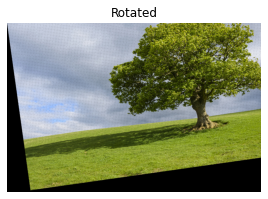

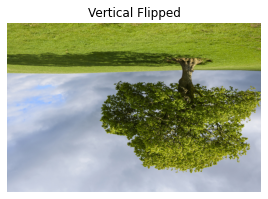

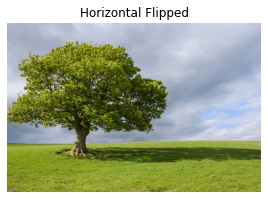

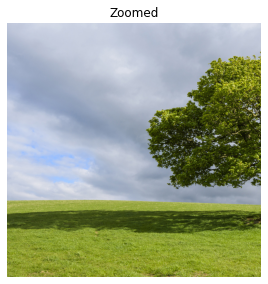

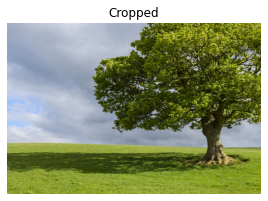

In [5]:
itt = ImageTransformations(image='C:\\Users\\wahby\\Desktop\\Images\\img_tree_2.jpg')

### Rotating ###
itt.rotate(angle_rotation=0.14,pivot_point=(0,0),shape_img=(800, 1200),with_plot_2=True)

### Vertical Flipping ###
itt.vertical_flip(with_plot_2=True)

### Horizontal Flipping ###
itt.horizontal_flip(with_plot_2=True)

### Zooming ###
itt.zooming(with_plot_2=True)

### Cropping ###
itt.cropping(150,580,860, with_plot_2=True)

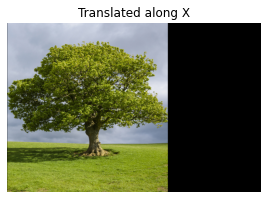

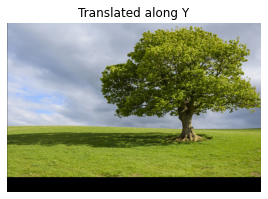

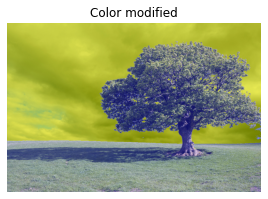

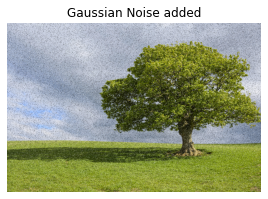

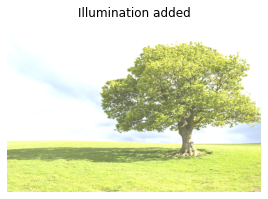

In [6]:
### Translating along X ###
itt.translation_along_x((-440,0),(800, 1200), with_plot_2=True)

### Translating along Y ###
itt.translation_along_y((0,-70),(800, 1200), with_plot_2=True)

### Modifying color ###
itt.modify_color(with_plot_2=True)

### Adding Gaussian Noise ###
itt.gaussian_noise(0.05,with_plot_2=True)

### Adding lighting ###
itt.illumination(with_plot_2=True)

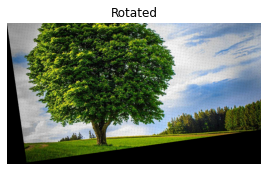

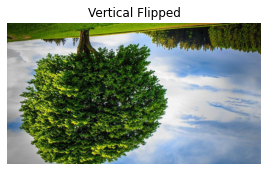

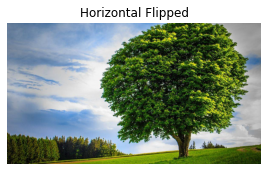

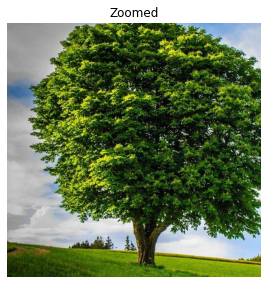

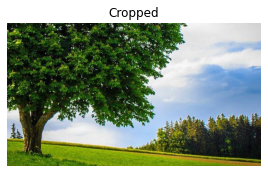

In [7]:
its = ImageTransformations(image='C:\\Users\\wahby\\Desktop\\Images\\img_tree_3.jpg')

### Rotating ###
its.rotate(angle_rotation=0.14,pivot_point=(0,0),shape_img=(667, 1200),with_plot_2=True)

### Vertical Flipping ###
its.vertical_flip(with_plot_2=True)

### Horizontal Flipping ###
its.horizontal_flip(with_plot_2=True)

### Zooming ###
its.zooming(with_plot_2=True)

### Cropping ###
its.cropping(300,400,650,with_plot_2=True)

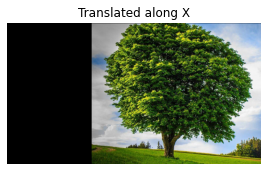

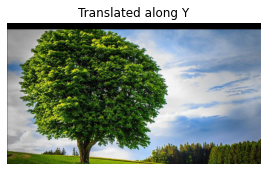

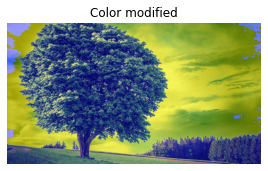

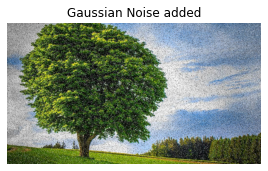

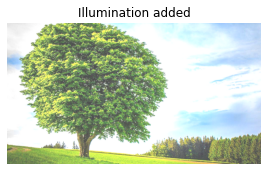

In [8]:
### Translating along X ###
its.translation_along_x((400,0),(667, 1200), with_plot_2=True)

### Translating along Y ###
its.translation_along_y((0,30),(667, 1200), with_plot_2=True)

### Modifying color ###
its.modify_color(with_plot_2=True)

### Adding Gaussian Noise ###
its.gaussian_noise(0.07,with_plot_2=True)

### Adding lighting ###
its.illumination(with_plot_2=True)

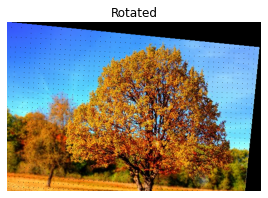

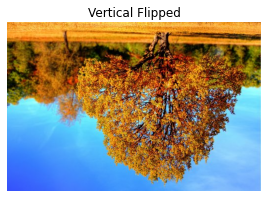

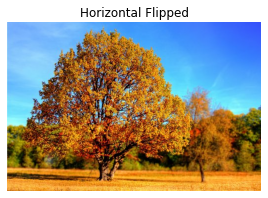

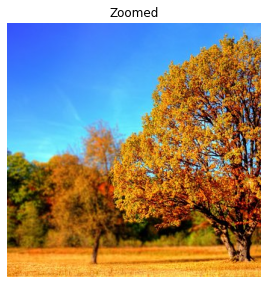

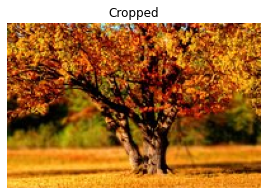

In [11]:
it5 = ImageTransformations(image='C:\\Users\\wahby\\Desktop\\Images\\img_tree_5.jpg')

### Rotating ###
it5.rotate(angle_rotation=-0.1,pivot_point=(0,0),shape_img=(340, 512),with_plot_2=True)

### Vertical Flipping ###
it5.vertical_flip(with_plot_2=True)

### Horizontal Flipping ###
it5.horizontal_flip(with_plot_2=True)

### Zooming ###
it5.zooming(with_plot_2=True)

### Cropping ###
it5.cropping(200,130,200, with_plot_2=True)

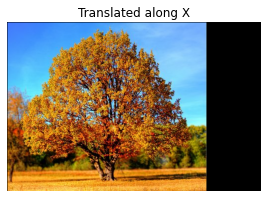

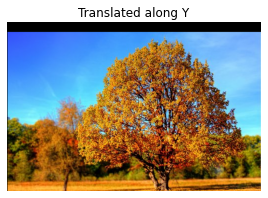

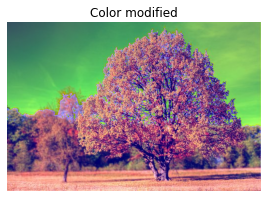

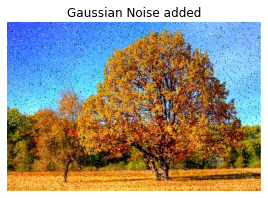

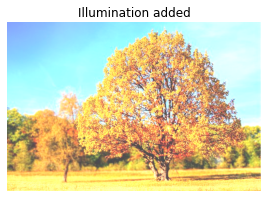

In [12]:
### Translating along X ###
it5.translation_along_x((-110,0),(340, 512), with_plot_2=True)

### Translating along Y ###
it5.translation_along_y((0,20),(340, 512), with_plot_2=True)

### Modifying color ###
it5.modify_color(with_plot_2=True)

### Adding Gaussian Noise ###
it5.gaussian_noise(0.03,with_plot_2=True)

### Adding lighting ###
it5.illumination(with_plot_2=True)

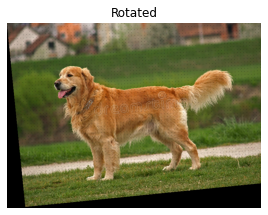

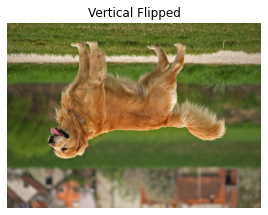

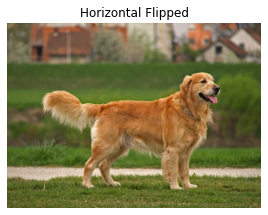

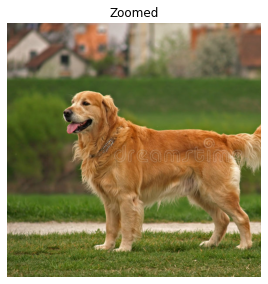

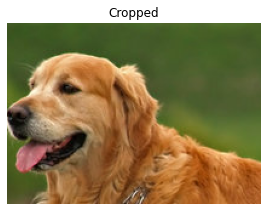

In [17]:
itd3 = ImageTransformations(image='C:\\Users\\wahby\\Desktop\\Images\\img_dog_6.jpg')

### Rotating ###
itd3.rotate(angle_rotation=0.1,pivot_point=(0,0),shape_img=(583, 800),with_plot_2=True)

### Vertical Flipping ###
itd3.vertical_flip(with_plot_2=True)

### Horizontal Flipping ###
itd3.horizontal_flip(with_plot_2=True)

### Zooming ###
itd3.zooming(with_plot_2=True)

### Cropping ###
itd3.cropping(130,150,210, with_plot_2=True)

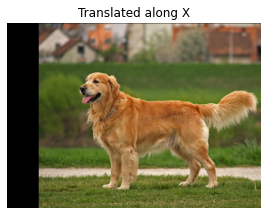

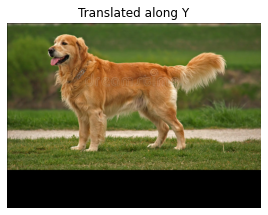

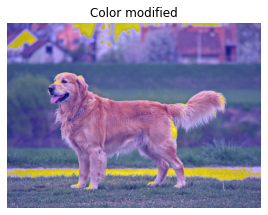

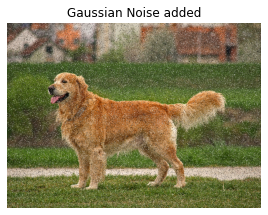

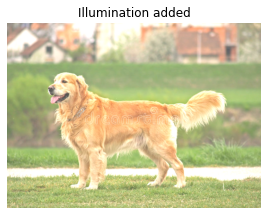

In [18]:
### Translating along X ###
itd3.translation_along_x((100,0),(583, 800), with_plot_2=True)

### Translating along Y ###
itd3.translation_along_y((0,-120),(583, 800), with_plot_2=True)

### Modifying color ###
itd3.modify_color(with_plot_2=True)

### Adding Gaussian Noise ###
itd3.gaussian_noise(0.05,with_plot_2=True)

### Adding lighting ###
itd3.illumination(with_plot_2=True)

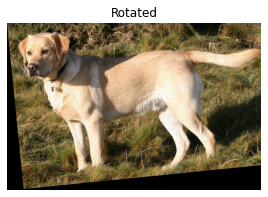

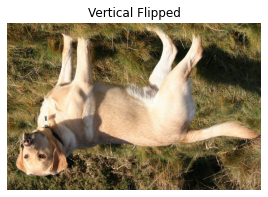

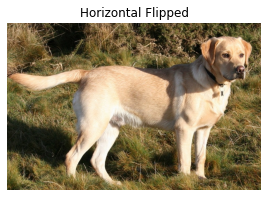

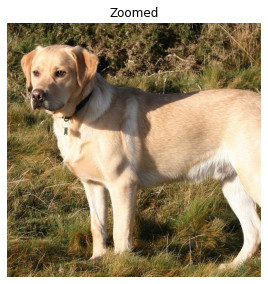

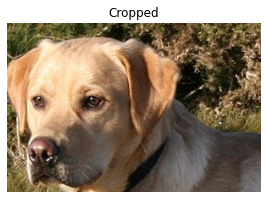

In [19]:
itd4 = ImageTransformations(image='C:\\Users\\wahby\\Desktop\\Images\\img_dog_7.jpg')

### Rotating ###
itd4.rotate(angle_rotation=0.1,pivot_point=(0,0),shape_img=(675, 1024),with_plot_2=True)

### Vertical Flipping ###
itd4.vertical_flip(with_plot_2=True)

### Horizontal Flipping ###
itd4.horizontal_flip(with_plot_2=True)

### Zooming ###
itd4.zooming(with_plot_2=True)

### Cropping ###
itd4.cropping(40,200,300, with_plot_2=True)

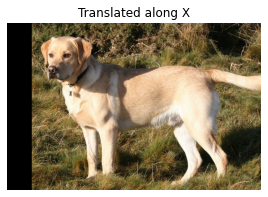

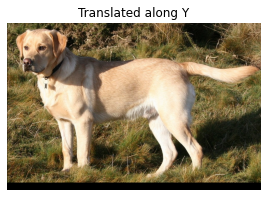

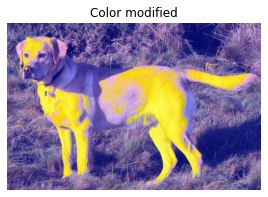

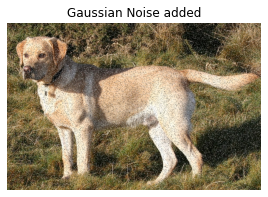

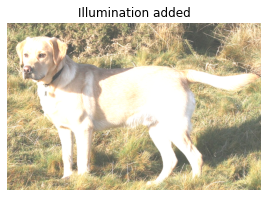

In [20]:
### Translating along X ###
itd4.translation_along_x((100,0),(675, 1024), with_plot_2=True)

### Translating along Y ###
itd4.translation_along_y((0,-30),(675, 1024), with_plot_2=True)

### Modifying color ###
itd4.modify_color(with_plot_2=True)

### Adding Gaussian Noise ###
itd4.gaussian_noise(0.06,with_plot_2=True)

### Adding lighting ###
itd4.illumination(with_plot_2=True)

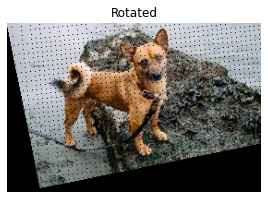

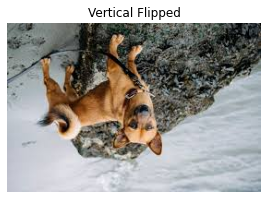

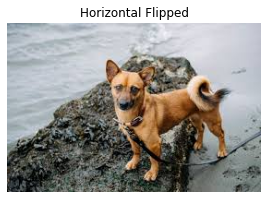

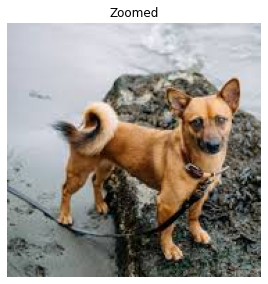

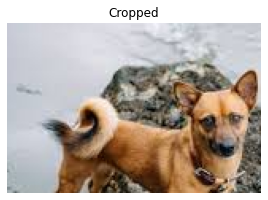

In [21]:
itd5 = ImageTransformations(image='C:\\Users\\wahby\\Desktop\\Images\\img_dog_5.jpg')

### Rotating ###
itd5.rotate(angle_rotation=0.2,pivot_point=(0,0),shape_img=(183, 275),with_plot_2=True)

### Vertical Flipping ###
itd5.vertical_flip(with_plot_2=True)

### Horizontal Flipping ###
itd5.horizontal_flip(with_plot_2=True)

### Zooming ###
itd5.zooming(with_plot_2=True)

### Cropping ###
itd5.cropping(10,107,160, with_plot_2=True)

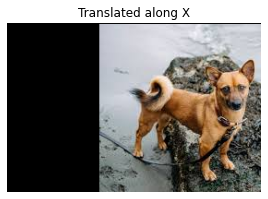

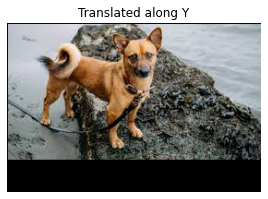

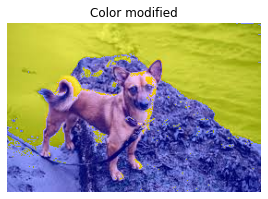

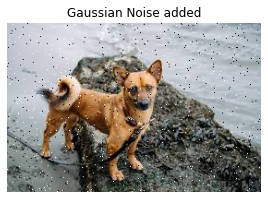

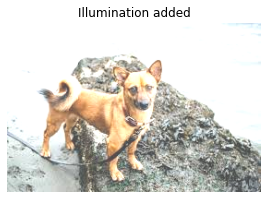

In [22]:
### Translating along X ###
itd5.translation_along_x((100,0),(183, 275), with_plot_2=True)

### Translating along Y ###
itd5.translation_along_y((0,-35),(183, 275), with_plot_2=True)

### Modifying color ###
itd5.modify_color(with_plot_2=True)

### Adding Gaussian Noise ###
itd5.gaussian_noise(0.009,with_plot_2=True)

### Adding lighting ###
itd5.illumination(with_plot_2=True)

## Comparing some transformed images with the originals

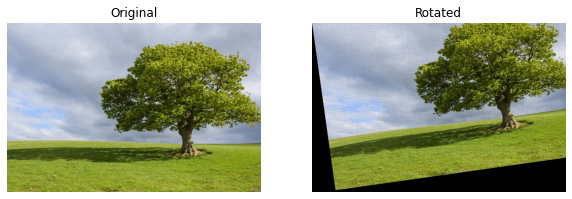

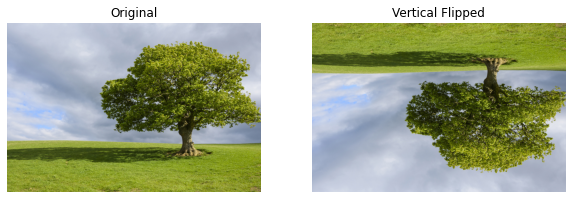

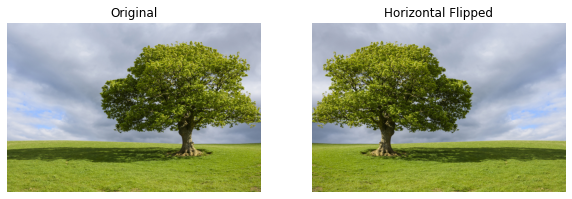

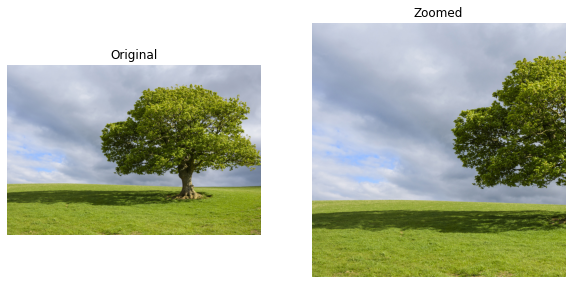

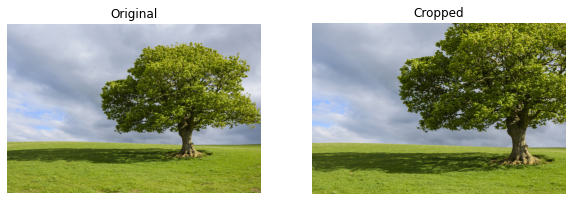

In [25]:
itt = ImageTransformations(image='C:\\Users\\wahby\\Desktop\\Images\\img_tree_2.jpg')

### Rotating ###
itt.rotate(angle_rotation=0.14,pivot_point=(0,0),shape_img=(800, 1200),with_plot=True)

### Vertical Flipping ###
itt.vertical_flip(with_plot=True)

### Horizontal Flipping ###
itt.horizontal_flip(with_plot=True)

### Zooming ###
itt.zooming(with_plot=True)

### Cropping ###
itt.cropping(150,580,860, with_plot=True)

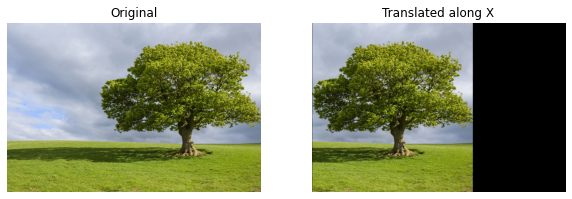

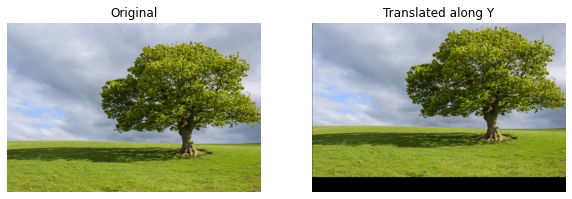

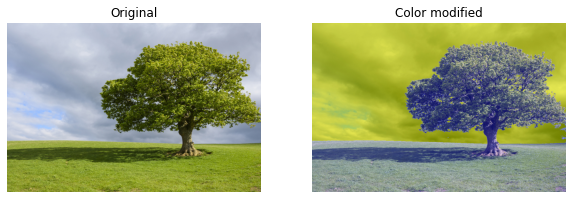

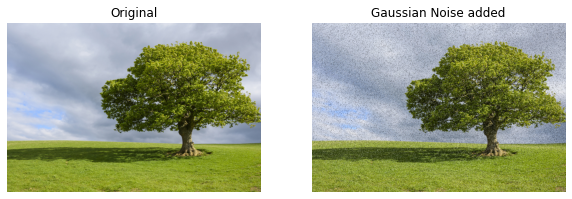

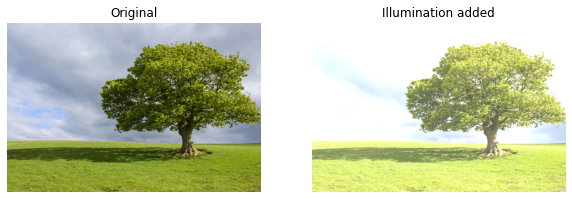

In [26]:
### Translating along X ###
itt.translation_along_x((-440,0),(800, 1200), with_plot=True)

### Translating along Y ###
itt.translation_along_y((0,-70),(800, 1200), with_plot=True)

### Modifying color ###
itt.modify_color(with_plot=True)

### Adding Gaussian Noise ###
itt.gaussian_noise(0.05,with_plot=True)

### Adding lighting ###
itt.illumination(with_plot=True)

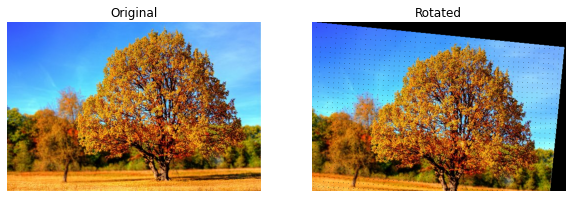

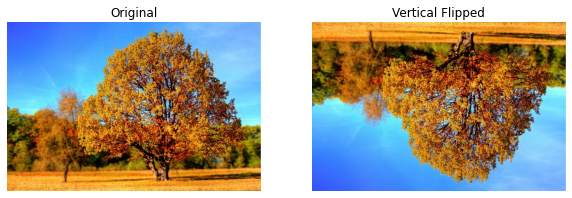

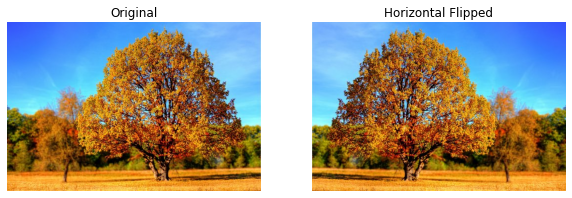

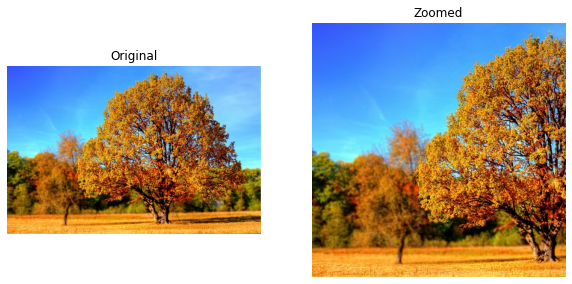

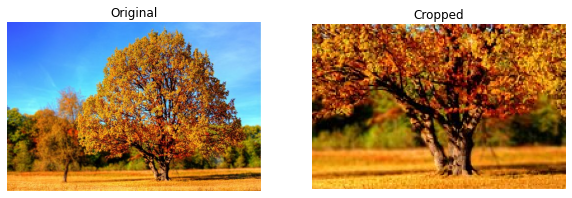

In [27]:
it5 = ImageTransformations(image='C:\\Users\\wahby\\Desktop\\Images\\img_tree_5.jpg')

### Rotating ###
it5.rotate(angle_rotation=-0.1,pivot_point=(0,0),shape_img=(340, 512),with_plot=True)

### Vertical Flipping ###
it5.vertical_flip(with_plot=True)

### Horizontal Flipping ###
it5.horizontal_flip(with_plot=True)

### Zooming ###
it5.zooming(with_plot=True)

### Cropping ###
it5.cropping(200,130,200, with_plot=True)

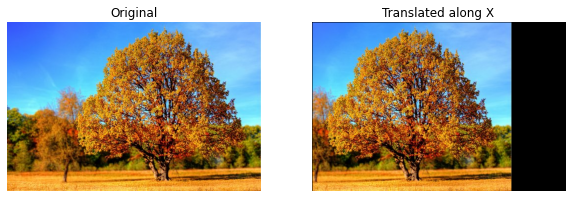

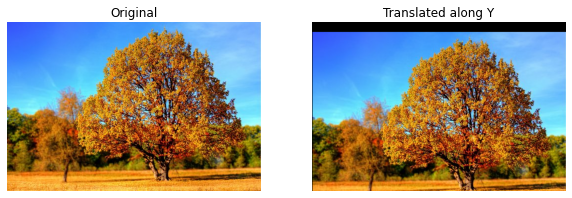

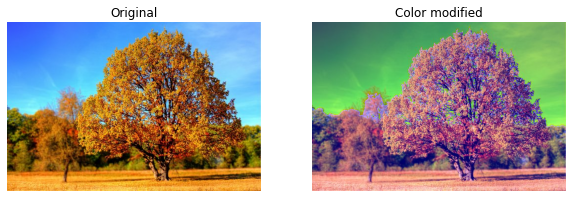

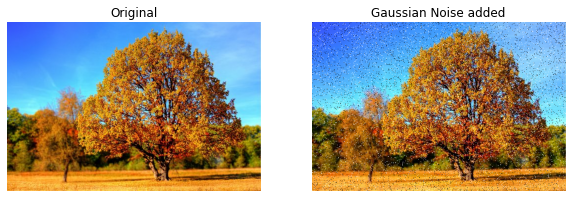

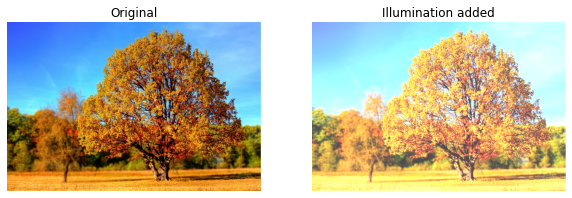

In [28]:
### Translating along X ###
it5.translation_along_x((-110,0),(340, 512), with_plot=True)

### Translating along Y ###
it5.translation_along_y((0,20),(340, 512), with_plot=True)

### Modifying color ###
it5.modify_color(with_plot=True)

### Adding Gaussian Noise ###
it5.gaussian_noise(0.03,with_plot=True)

### Adding lighting ###
it5.illumination(with_plot=True)

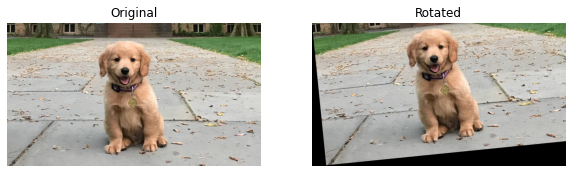

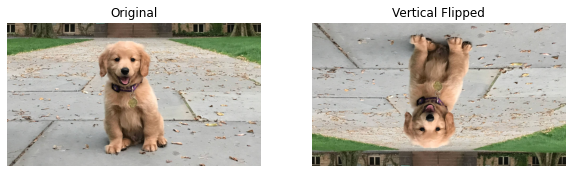

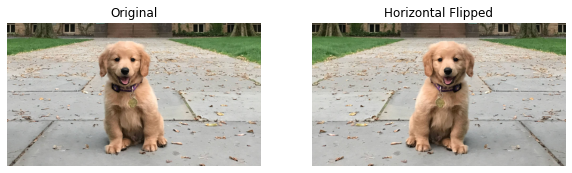

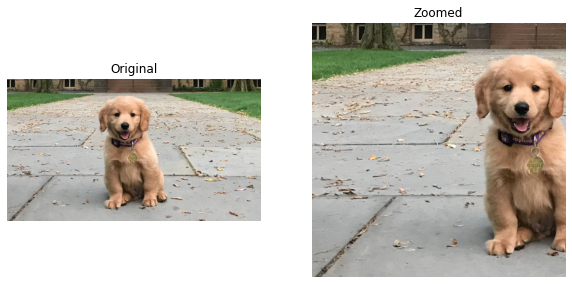

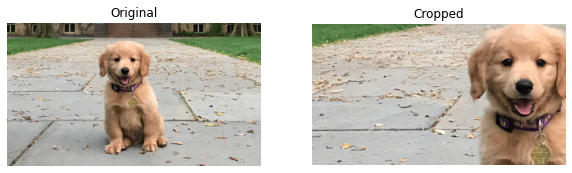

In [29]:
itd = ImageTransformations(image='C:\\Users\\wahby\\Desktop\\Images\\img_dog_1.jpg')

### Rotating ###
itd.rotate(angle_rotation=0.1,pivot_point=(0,0),shape_img=(1080, 1920),with_plot=True)

### Vertical Flipping ###
itd.vertical_flip(with_plot=True)

### Horizontal Flipping ###
itd.horizontal_flip(with_plot=True)

### Zooming ###
itd.zooming(with_plot=True)

### Cropping ###
itd.cropping(140,500,900, with_plot=True)

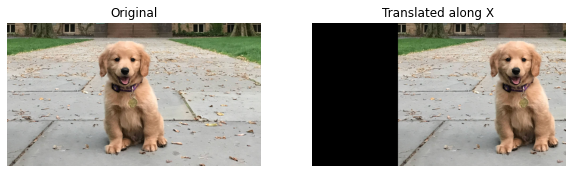

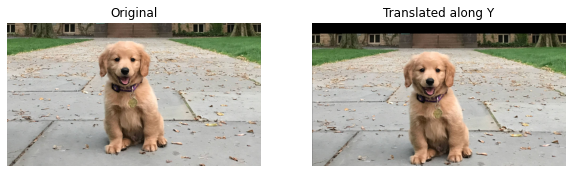

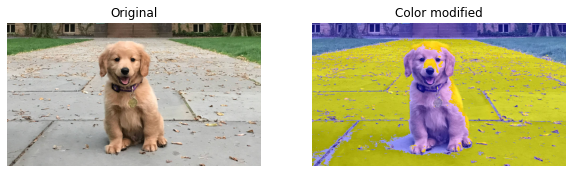

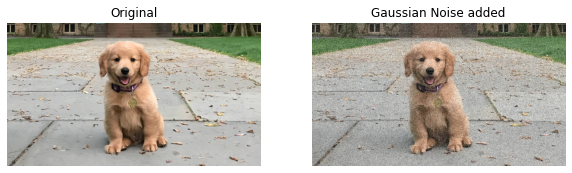

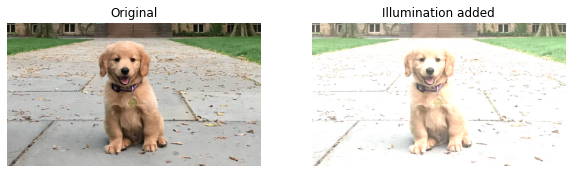

In [30]:
### Translating along X ###
itd.translation_along_x((650,0),(1080, 1920), with_plot=True)

### Translating along Y ###
itd.translation_along_y((0,80),(1080, 1920), with_plot=True)

### Modifying color ###
itd.modify_color(with_plot=True)

### Adding Gaussian Noise ###
itd.gaussian_noise(0.1,with_plot=True)

### Adding lighting ###
itd.illumination(with_plot=True)

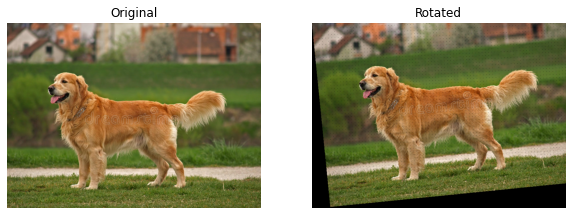

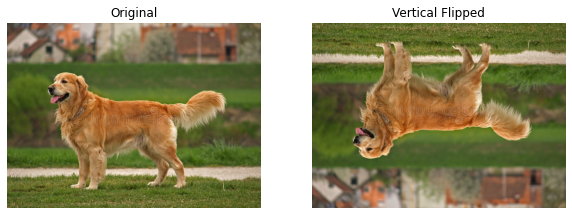

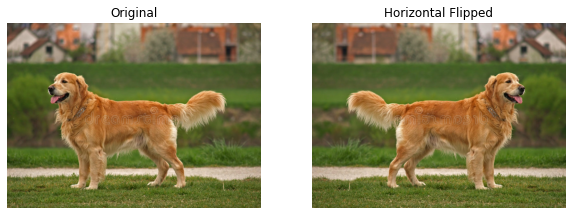

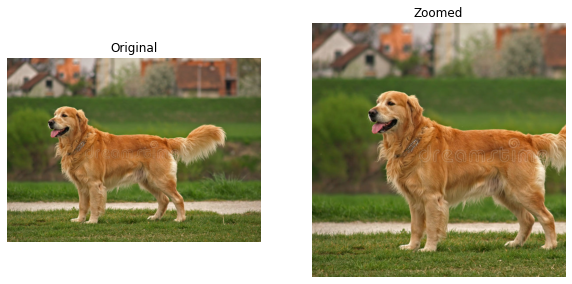

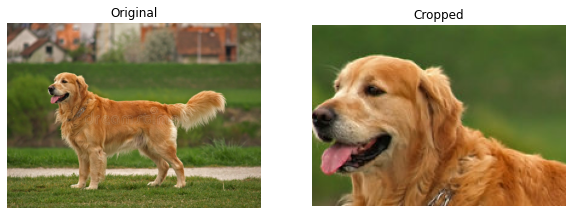

In [31]:
itd3 = ImageTransformations(image='C:\\Users\\wahby\\Desktop\\Images\\img_dog_6.jpg')

### Rotating ###
itd3.rotate(angle_rotation=0.1,pivot_point=(0,0),shape_img=(583, 800),with_plot=True)

### Vertical Flipping ###
itd3.vertical_flip(with_plot=True)

### Horizontal Flipping ###
itd3.horizontal_flip(with_plot=True)

### Zooming ###
itd3.zooming(with_plot=True)

### Cropping ###
itd3.cropping(130,150,210, with_plot=True)

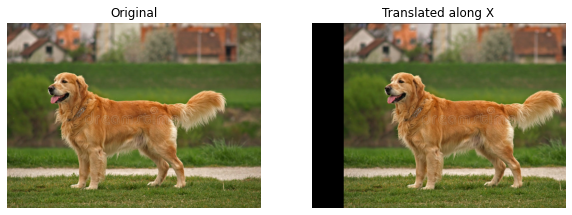

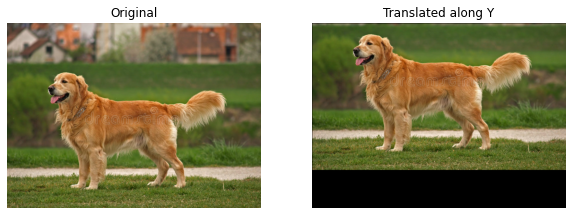

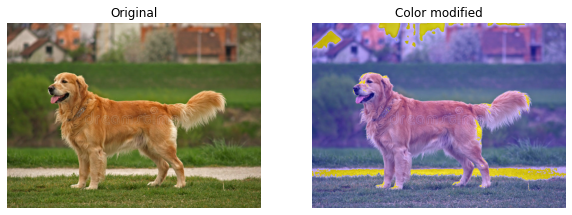

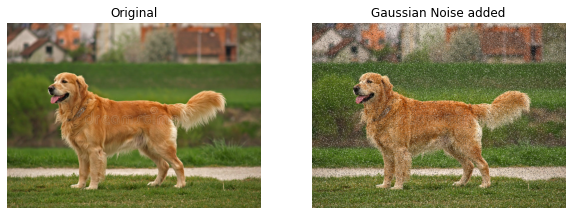

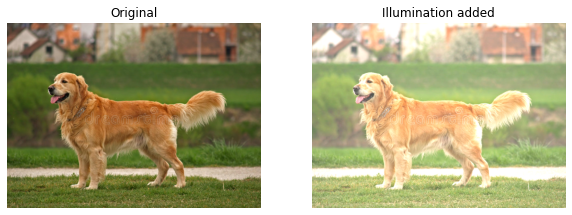

In [32]:
### Translating along X ###
itd3.translation_along_x((100,0),(583, 800), with_plot=True)

### Translating along Y ###
itd3.translation_along_y((0,-120),(583, 800), with_plot=True)

### Modifying color ###
itd3.modify_color(with_plot=True)

### Adding Gaussian Noise ###
itd3.gaussian_noise(0.05,with_plot=True)

### Adding lighting ###
itd3.illumination(with_plot=True)

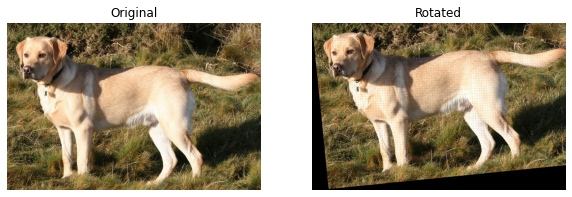

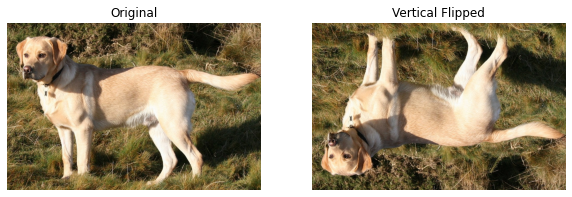

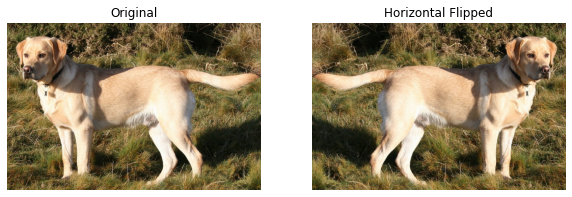

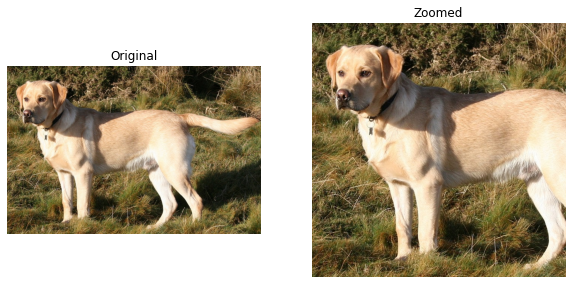

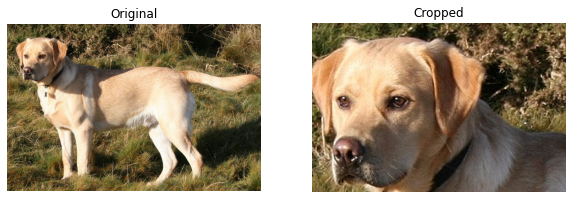

In [33]:
itd4 = ImageTransformations(image='C:\\Users\\wahby\\Desktop\\Images\\img_dog_7.jpg')

### Rotating ###
itd4.rotate(angle_rotation=0.1,pivot_point=(0,0),shape_img=(675, 1024),with_plot=True)

### Vertical Flipping ###
itd4.vertical_flip(with_plot=True)

### Horizontal Flipping ###
itd4.horizontal_flip(with_plot=True)

### Zooming ###
itd4.zooming(with_plot=True)

### Cropping ###
itd4.cropping(40,200,300, with_plot=True)

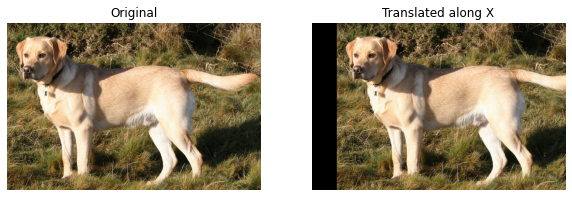

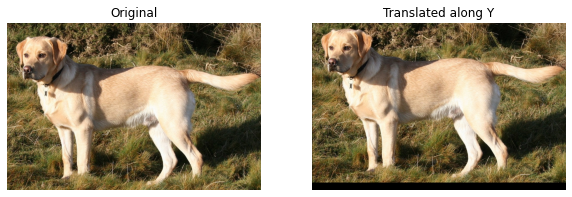

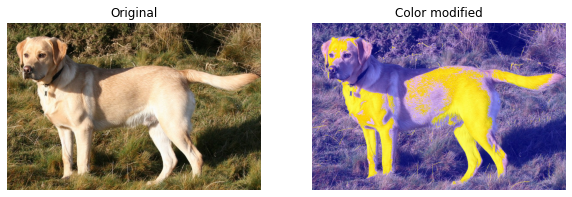

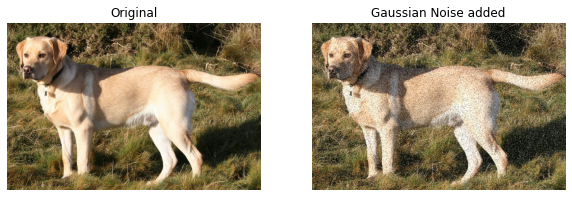

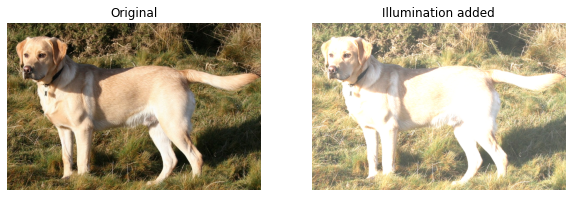

In [34]:
### Translating along X ###
itd4.translation_along_x((100,0),(675, 1024), with_plot=True)

### Translating along Y ###
itd4.translation_along_y((0,-30),(675, 1024), with_plot=True)

### Modifying color ###
itd4.modify_color(with_plot=True)

### Adding Gaussian Noise ###
itd4.gaussian_noise(0.06,with_plot=True)

### Adding lighting ###
itd4.illumination(with_plot=True)

## Histograms of the original image and of some resulting images 

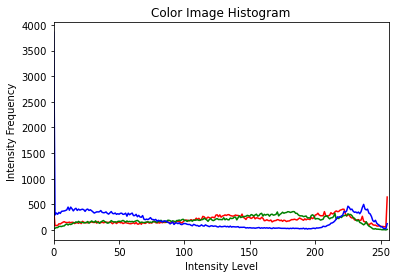

In [35]:
it.plot_Histogram(gray_scale=False)

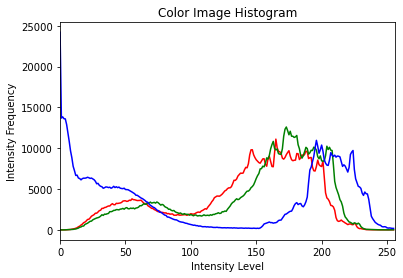

In [36]:
itt.plot_Histogram(gray_scale=False)

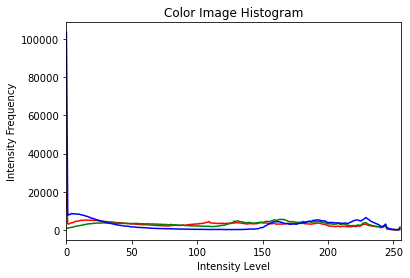

In [37]:
its.plot_Histogram(gray_scale=False)

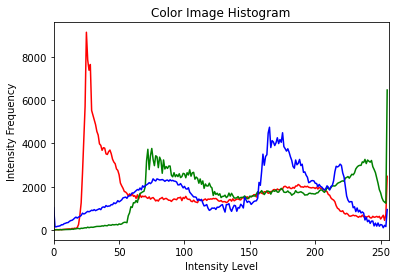

In [38]:
itp.plot_Histogram(gray_scale=False)

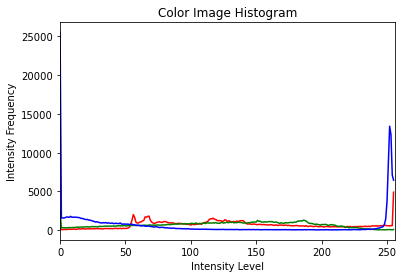

In [39]:
it5.plot_Histogram(gray_scale=False)

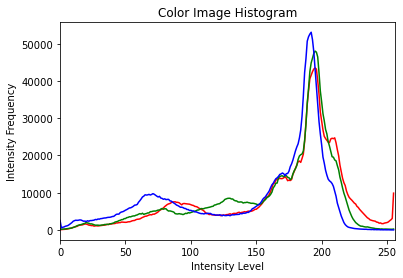

In [40]:
itd.plot_Histogram(gray_scale=False)

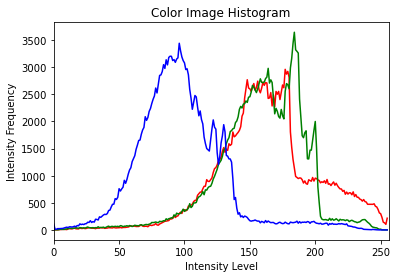

In [41]:
itd2.plot_Histogram(gray_scale=False)

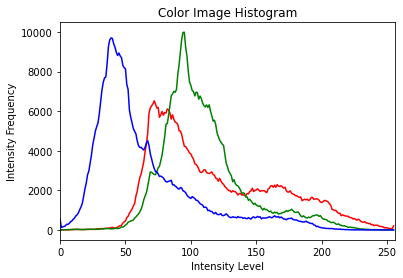

In [42]:
itd3.plot_Histogram(gray_scale=False)

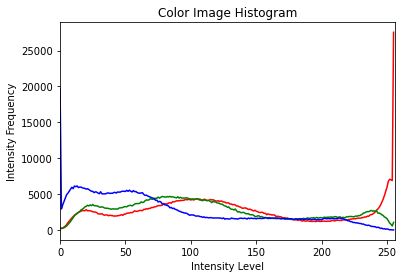

In [43]:
itd4.plot_Histogram(gray_scale=False)

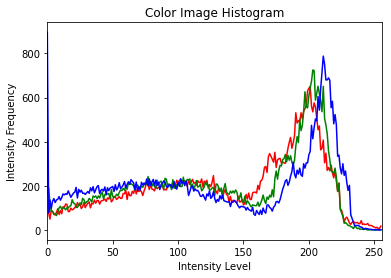

In [44]:
itd5.plot_Histogram(gray_scale=False)

## Applying a binary classifier on data and presenting the results

In [62]:
import tensorflow as tf
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing import image
from tensorflow.keras.utils import load_img, img_to_array

In [63]:
train_datagen = ImageDataGenerator(
    rescale= 1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

train_set =  train_datagen.flow_from_directory(
        'C:\\Users\\wahby\\Desktop\\Images\\Images\\Training',
        target_size=(64, 64),
        batch_size=32,
        class_mode='binary')

test_datagen = ImageDataGenerator(rescale=1./255)
test_set = test_datagen.flow_from_directory(
        'C:\\Users\\wahby\\Desktop\\Images\\Images\\Test',
        target_size=(64, 64),
        batch_size=32,
        class_mode='binary')

Found 6 images belonging to 2 classes.
Found 4 images belonging to 2 classes.


In [64]:
train_set.class_indices

{'Dog': 0, 'Tree': 1}

In [65]:
cnn = tf.keras.models.Sequential()

# convolution layer 1
cnn.add(tf.keras.layers.Conv2D(filters=32,kernel_size = 3,activation = 'relu', input_shape = [64,64,3]))
# max pooling layer 1
cnn.add(tf.keras.layers.MaxPool2D(pool_size=2, strides = 2))
# convolution layer 2
cnn.add(tf.keras.layers.Conv2D(filters=64,kernel_size = 3,activation = 'relu'))
# max pooling layer 2
cnn.add(tf.keras.layers.MaxPool2D(pool_size=2, strides = 2))
# flattening
cnn.add(tf.keras.layers.Flatten())

cnn.add(tf.keras.layers.Dense(units=128, activation='relu'))

cnn.add(tf.keras.layers.Dense(units=1, activation='sigmoid'))

cnn.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 62, 62, 32)        896       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 31, 31, 32)       0         
 2D)                                                             
                                                                 
 conv2d_3 (Conv2D)           (None, 29, 29, 64)        18496     
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 14, 14, 64)       0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 12544)             0         
                                                                 
 dense_2 (Dense)             (None, 128)              

In [69]:
cnn.compile(optimizer ='adam', loss ='binary_crossentropy', metrics = ['accuracy'])

hist =  cnn.fit(x= train_set, validation_data = test_set, epochs = 25)

Epoch 1/25
1/1 [==============================] - 1s 1s/step - loss: 0.0056 - accuracy: 1.0000 - val_loss: 6.4425 - val_accuracy: 0.5000
Epoch 2/25
1/1 [==============================] - 0s 139ms/step - loss: 1.8211 - accuracy: 0.5000 - val_loss: 0.3555 - val_accuracy: 0.7500
Epoch 3/25
1/1 [==============================] - 0s 148ms/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 0.6595 - val_accuracy: 0.7500
Epoch 4/25
1/1 [==============================] - 0s 145ms/step - loss: 0.5140 - accuracy: 0.6667 - val_loss: 0.9359 - val_accuracy: 0.7500
Epoch 5/25
1/1 [==============================] - 0s 134ms/step - loss: 0.6326 - accuracy: 0.8333 - val_loss: 0.3499 - val_accuracy: 0.7500
Epoch 6/25
1/1 [==============================] - 0s 138ms/step - loss: 0.3513 - accuracy: 0.8333 - val_loss: 0.0397 - val_accuracy: 1.0000
Epoch 7/25
1/1 [==============================] - 0s 134ms/step - loss: 0.0146 - accuracy: 1.0000 - val_loss: 0.2948 - val_accuracy: 0.7500
Epoch 8/25
1/1 [=======

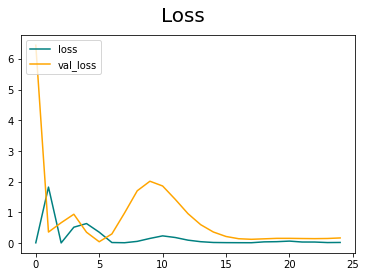

In [70]:
fig = plt.figure()
plt.plot(hist.history['loss'], color='teal', label='loss')
plt.plot(hist.history['val_loss'], color='orange', label='val_loss')
fig.suptitle('Loss', fontsize=20)
plt.legend(loc="upper left")
plt.show()

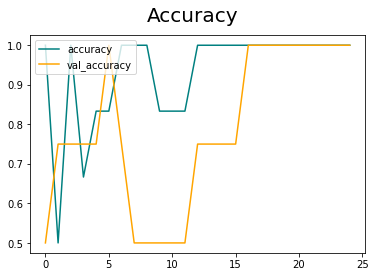

In [71]:
fig = plt.figure()
plt.plot(hist.history['accuracy'], color='teal', label='accuracy')
plt.plot(hist.history['val_accuracy'], color='orange', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=20)
plt.legend(loc="upper left")
plt.show()

In [72]:
cnn.evaluate(test_set)

1/1 [==============================] - 0s 96ms/step - loss: 0.1639 - accuracy: 1.0000


[0.16387633979320526, 1.0]

## Making some predictions

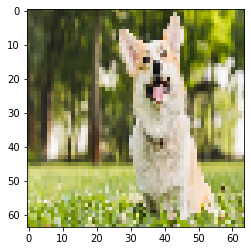

1/1 [==============================] - 0s 16ms/step
{'Dog': 0, 'Tree': 1}
Dog


In [74]:
test_image = tf.keras.utils.load_img("C:\\Users\\wahby\\Desktop\\Images\\Images\\Single_Prediction\\dog_or_tree_1.jpg", target_size=(64,64))
plt.imshow(test_image)
plt.show()

test_image = tf.keras.utils.img_to_array(test_image)
test_image = np.expand_dims(test_image, axis=0)
res = cnn.predict(test_image)
print(train_set.class_indices)
if res[0][0] == 1:
        pred = "Tree"
else:
        pred = "Dog"
print(pred)

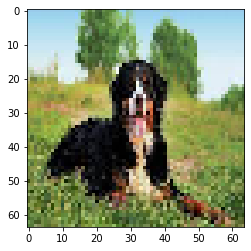

1/1 [==============================] - 0s 16ms/step
{'Dog': 0, 'Tree': 1}
Dog


In [75]:
test_image = tf.keras.utils.load_img("C:\\Users\\wahby\\Desktop\\Images\\Images\\Single_Prediction\\dog_or_tree_2.jpg", target_size=(64,64))
plt.imshow(test_image)
plt.show()

test_image = tf.keras.utils.img_to_array(test_image)
test_image = np.expand_dims(test_image, axis=0)
res = cnn.predict(test_image)
print(train_set.class_indices)
if res[0][0] == 1:
        pred = "Tree"
else:
        pred = "Dog"
print(pred)

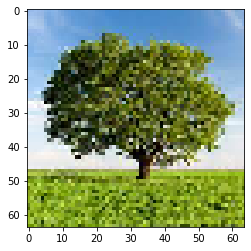

1/1 [==============================] - 0s 16ms/step
{'Dog': 0, 'Tree': 1}
Tree


In [76]:
test_image = tf.keras.utils.load_img("C:\\Users\\wahby\\Desktop\\Images\\Images\\Single_Prediction\\dog_or_tree_3.jpg", target_size=(64,64))
plt.imshow(test_image)
plt.show()

test_image = tf.keras.utils.img_to_array(test_image)
test_image = np.expand_dims(test_image, axis=0)
res = cnn.predict(test_image)
print(train_set.class_indices)
if res[0][0] == 1:
        pred = "Tree"
else:
        pred = "Dog"
print(pred)

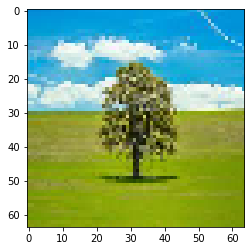

1/1 [==============================] - 0s 18ms/step
{'Dog': 0, 'Tree': 1}
Tree


In [77]:
test_image = tf.keras.utils.load_img("C:\\Users\\wahby\\Desktop\\Images\\Images\\Single_Prediction\\dog_or_tree_4.jpg", target_size=(64,64))
plt.imshow(test_image)
plt.show()

test_image = tf.keras.utils.img_to_array(test_image)
test_image = np.expand_dims(test_image, axis=0)
res = cnn.predict(test_image)
print(train_set.class_indices)
if res[0][0] == 1:
        pred = "Tree"
else:
        pred = "Dog"
print(pred)

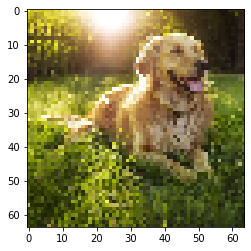

1/1 [==============================] - 0s 16ms/step
{'Dog': 0, 'Tree': 1}
Dog


In [78]:
test_image = tf.keras.utils.load_img("C:\\Users\\wahby\\Desktop\\Images\\Images\\Single_Prediction\\dog_or_tree_5.jpg", target_size=(64,64))
plt.imshow(test_image)
plt.show()

test_image = tf.keras.utils.img_to_array(test_image)
test_image = np.expand_dims(test_image, axis=0)
res = cnn.predict(test_image)
print(train_set.class_indices)
if res[0][0] == 1:
        pred = "Tree"
else:
        pred = "Dog"
print(pred)

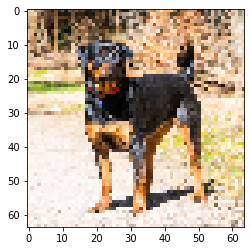

1/1 [==============================] - 0s 15ms/step
{'Dog': 0, 'Tree': 1}
Dog


In [79]:
test_image = tf.keras.utils.load_img("C:\\Users\\wahby\\Desktop\\Images\\Images\\Single_Prediction\\dog_or_tree_6.jpg", target_size=(64,64))
plt.imshow(test_image)
plt.show()

test_image = tf.keras.utils.img_to_array(test_image)
test_image = np.expand_dims(test_image, axis=0)
res = cnn.predict(test_image)
print(train_set.class_indices)
if res[0][0] == 1:
        pred = "Tree"
else:
        pred = "Dog"
print(pred)

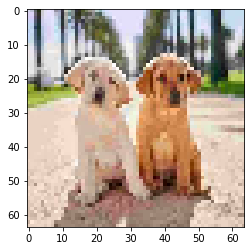

1/1 [==============================] - 0s 16ms/step
{'Dog': 0, 'Tree': 1}
Dog


In [80]:
test_image = tf.keras.utils.load_img("C:\\Users\\wahby\\Desktop\\Images\\Images\\Single_Prediction\\dog_or_tree_7.jpg", target_size=(64,64))
plt.imshow(test_image)
plt.show()

test_image = tf.keras.utils.img_to_array(test_image)
test_image = np.expand_dims(test_image, axis=0)
res = cnn.predict(test_image)
print(train_set.class_indices)
if res[0][0] == 1:
        pred = "Tree"
else:
        pred = "Dog"
print(pred)

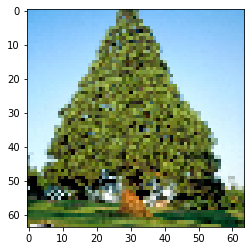

1/1 [==============================] - 0s 18ms/step
{'Dog': 0, 'Tree': 1}
Tree


In [81]:
test_image = tf.keras.utils.load_img("C:\\Users\\wahby\\Desktop\\Images\\Images\\Single_Prediction\\dog_or_tree_8.jpg", target_size=(64,64))
plt.imshow(test_image)
plt.show()

test_image = tf.keras.utils.img_to_array(test_image)
test_image = np.expand_dims(test_image, axis=0)
res = cnn.predict(test_image)
print(train_set.class_indices)
if res[0][0] == 1:
        pred = "Tree"
else:
        pred = "Dog"
print(pred)